In [3]:
%pip install decorator==5.0.9

import networkx as nx
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns

Note: you may need to restart the kernel to use updated packages.


In [4]:
import imp
import sys

sys.path.append('../../src/')

import text_cleanup.text_cleanup as thesisCleanUp
import preprocessing.text_preprocessing as thesisTextPreprocessing
import data.reader as thesisDataReader
import utils.utils as thesisUtils
import features.tf_idf.n_gram as thesisTfIdfNgramFeatures
import similarities.cosine as thesisCosineSimilarity

imp.reload(thesisCleanUp)
imp.reload(thesisTextPreprocessing)
imp.reload(thesisDataReader)
imp.reload(thesisUtils)
imp.reload(thesisCosineSimilarity)
imp.reload(thesisTfIdfNgramFeatures)

<module 'features.tf_idf.n_gram' from '../../src/features/tf_idf/n_gram.py'>

In [5]:
zwickau_5_gram = thesisTfIdfNgramFeatures.create_zwickau_5_gram()
london_5_gram = thesisTfIdfNgramFeatures.create_london_5_gram()

In [6]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import DBSCAN
from sklearn.neighbors import kneighbors_graph, DistanceMetric

In [7]:
def calculate_and_show_distance_metrics(X):
    dist = DistanceMetric.get_metric('euclidean')
    distances = dist.pairwise(X)
    sns.distplot(distances, hist=True, kde=True)
    plt.xlabel('Epsilon distance')
    plt.title("Distribution of distances between points")

In [8]:
def calculate_and_plot_cluster(features):
    pca = PCA(n_components=2)
    features_pca = pca.fit_transform(features)
    
    plt.figure(figsize=[20,10])
    
    clusters = DBSCAN(eps=0.01, metric='cosine', min_samples=10).fit_predict(features_pca)
    sns.scatterplot(
        x = features_pca[:, 0],
        y = features_pca[:, 1],
        hue = clusters,
        legend="full",
        palette="rainbow"
    )
    return clusters

In [33]:
list(map(int, np.linspace(1,50,5)))

[1, 13, 25, 37, 50]

In [40]:
def calculate_and_plot_cluster(features):
    pca = PCA(n_components=2)
    features_pca = pca.fit_transform(features)
    
    number_of_iters = 20
    num_of_min_samples = 5
    fig, ax = plt.subplots(number_of_iters * num_of_min_samples,1,figsize=(20,750))
    
#     for i, epsilon in enumerate(np.linspace(0.001, 0.01, number_of_iters)):
    for i, epsilon in enumerate(np.linspace(0.001, 0.019, number_of_iters)):
        for ii, min_sample in enumerate(list(map(int, np.linspace(1,45,num_of_min_samples)))):
            ax_ = ax[(i*num_of_min_samples)+ii]
#             print(epsilon)
            clusters = DBSCAN(
                eps=epsilon, 
                metric='cosine', 
                min_samples=min_sample
            ).fit_predict(features_pca)
            sns.scatterplot(
                x = features_pca[:, 0],
                y = features_pca[:, 1],
                hue = clusters,
                legend="full",
                palette="rainbow",
                ax = ax_
            )
            ax_.set_title(f'epsilon: {epsilon}, min sample: {min_sample}')
#     return clusters

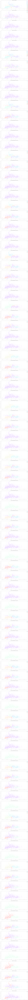

In [41]:
calculate_and_plot_cluster(zwickau_5_gram.to_numpy())

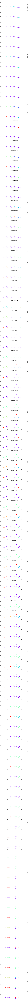

In [42]:
calculate_and_plot_cluster(london_5_gram.to_numpy())

/Users/sasha.kruglyak/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


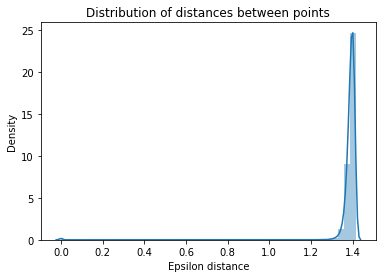

In [54]:
calculate_and_show_distance_metrics(zwickau_5_gram.to_numpy())

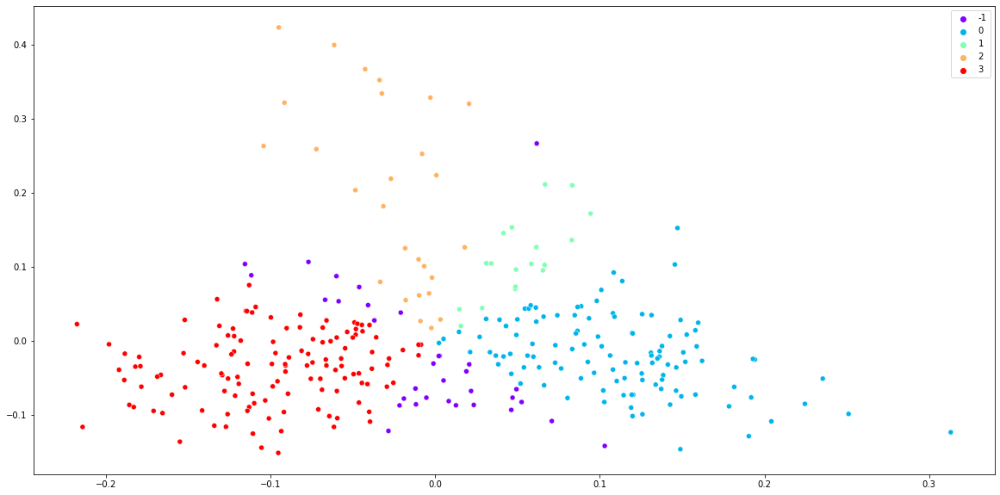

In [10]:
calculate_and_plot_cluster(london_5_gram.to_numpy())

<AxesSubplot:>

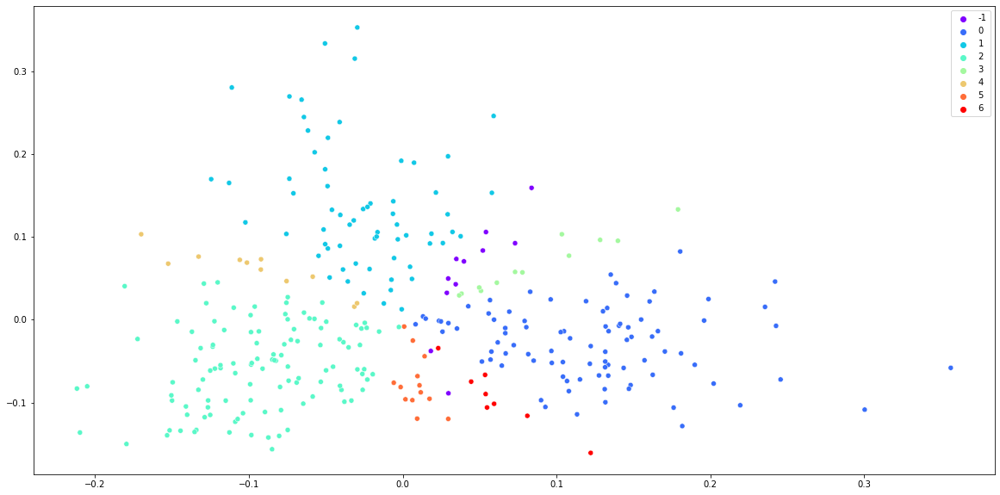

In [207]:
import seaborn as sns

pca_zwickau = PCA(n_components=2)
X_pca_zwickau = pca.fit_transform(zwickau_5_gram.to_numpy())

plt.figure(figsize=[20,10])
sns.scatterplot(
    x=X_pca_zwickau[:, 0], 
    y=X_pca_zwickau[:, 1], 
    hue=DBSCAN(eps=0.01, metric='cosine', min_samples=10).fit_predict(X_pca_zwickau), 
    legend="full",
    palette="rainbow"
)

# for i in range(0, len(X_pca_zwickau)):
#     plt.text(X_pca_zwickau[i][0],X_pca_zwickau[i][1], i, color='black')

<AxesSubplot:>

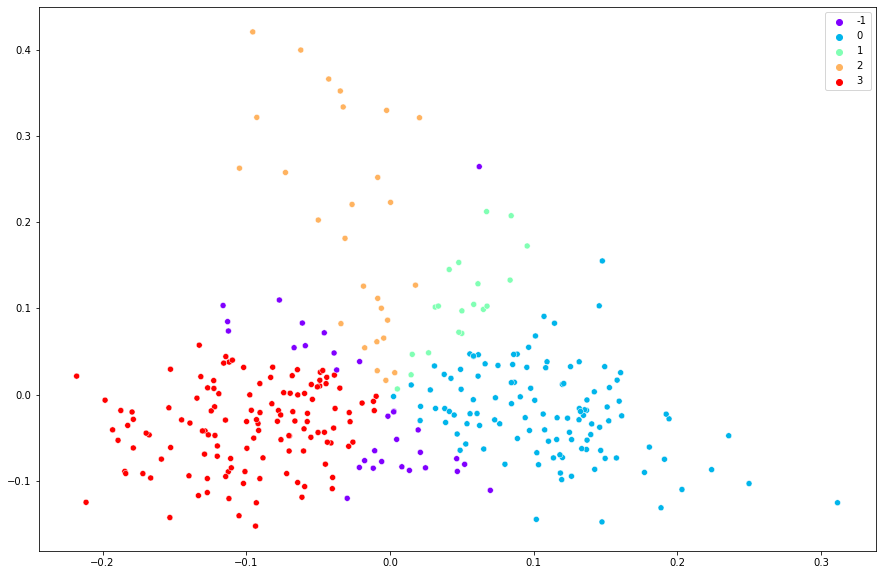

In [181]:
import seaborn as sns

pca_zwickau = PCA(n_components=2)
X_pca_london = pca.fit_transform(london_5_gram.to_numpy())

plt.figure(figsize=[15,10])
sns.scatterplot(
    x=X_pca_london[:, 0], 
    y=X_pca_london[:, 1], 
    hue=DBSCAN(eps=0.01, metric='cosine', min_samples=10).fit_predict(X_pca_london), 
    legend="full",
    palette="rainbow"
)

In [127]:
DBSCAN(eps=0.005, metric='cosine').fit_predict(X_pca_zwickau)

array([ 4,  0,  0,  0,  0,  0,  0,  0,  1,  1,  0,  1,  0,  1,  1,  1,  1,
        1,  1,  2,  1,  1,  0,  3,  0, -1,  0,  0,  3,  3,  0,  1,  3,  0,
        3,  3,  0,  0,  0,  0,  3,  4,  0,  0,  0,  0,  0,  3,  3,  0,  3,
        3,  1,  5,  1, -1,  1,  3,  1,  0,  3,  3,  3,  3,  0,  1,  1,  3,
        3,  1,  1,  1,  1,  5,  5,  3,  3,  3,  3,  3,  1,  3,  1,  0,  5,
        1,  2,  1,  0,  3,  3,  3,  3,  0,  4,  1,  0,  0,  3,  3,  3,  3,
        3,  3,  3,  1,  3,  0,  3,  5,  3,  1,  3,  0,  3,  1,  4,  1,  1,
        1,  3,  0,  0,  0,  1,  3,  5,  3,  3,  3,  2,  0,  3,  4,  3,  3,
        3,  3,  3,  3,  1,  1,  3,  3,  3,  3,  3,  1,  3,  1,  1,  0,  0,
        0,  3,  3,  3,  3,  3,  3,  0,  3,  3,  0,  0,  3,  3,  5,  0,  1,
        0,  2,  1,  1,  1,  1,  1, -1,  1,  0,  2,  1,  1,  1,  0,  0,  4,
        3,  3,  1,  3,  3,  1,  0,  0,  0,  0,  0,  3,  3,  1,  1,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  0,  0,  0,  0,  4,  4,  4,  3,  3,
        3,  3,  1,  5,  3

In [128]:
DBSCAN(metric='cosine').fit_predict(zwickau_5_gram.to_numpy())

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1

array([[ 2.41434731e-02, -8.74714281e-02],
       [ 1.31319015e-01, -3.01164021e-02],
       [ 8.88105075e-02, -4.97566871e-02],
       [ 4.90898803e-02,  7.07462521e-02],
       [ 1.20164401e-01, -7.34877274e-02],
       [ 1.35883369e-01, -2.16251155e-02],
       [ 1.26530082e-01, -5.26369966e-02],
       [ 9.51392081e-02,  3.29140168e-02],
       [-7.54835298e-04,  8.39938576e-02],
       [-1.83223262e-03,  1.53714271e-02],
       [-1.04326085e-02, -8.44850184e-02],
       [-6.37539254e-02, -2.92524278e-02],
       [-3.75772471e-02, -3.77352663e-02],
       [-3.89175542e-02, -5.74955681e-02],
       [-1.10739184e-01, -8.54299939e-02],
       [-1.39379459e-01, -3.19956589e-02],
       [-4.33947294e-02,  1.31536913e-02],
       [-6.62151224e-02,  5.48549111e-02],
       [-4.74190111e-02,  6.38775577e-03],
       [ 9.35440056e-02, -2.97895734e-02],
       [-7.92647336e-03,  1.11314481e-01],
       [-8.25245297e-03,  6.31389853e-02],
       [-1.64152170e-01, -9.54491791e-02],
       [ 1.

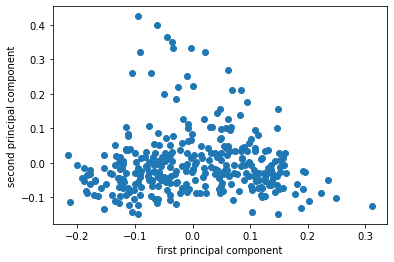

In [106]:
pca_london = PCA(n_components=2)
X_pca = pca.fit_transform(london_5_gram.to_numpy())
plt.scatter(X_pca[:, 0], X_pca[:, 1])
plt.xlabel("first principal component")
plt.ylabel("second principal component")

In [79]:
km = KMeans(n_clusters=4)
km.fit(similarities)

KMeans(n_clusters=4)

In [80]:
km.labels_

array([2, 3, 2, 2, 3, 3, 3, 3, 1, 1, 3, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       3, 1, 3, 1, 2, 3, 2, 2, 3, 1, 2, 3, 2, 2, 3, 1, 1, 3, 1, 2, 3, 1,
       3, 3, 1, 2, 2, 3, 2, 2, 1, 1, 1, 1, 1, 2, 1, 3, 2, 2, 2, 1, 1, 1,
       2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1,
       3, 1, 1, 2, 2, 2, 1, 1, 2, 2, 2, 1, 2, 1, 2, 2, 1, 1, 2, 1, 1, 1,
       1, 2, 1, 3, 1, 1, 2, 1, 1, 2, 1, 3, 3, 3, 1, 2, 1, 2, 2, 2, 3, 3,
       2, 2, 1, 1, 2, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 1, 2, 1, 1, 3, 3, 3,
       2, 1, 2, 2, 2, 2, 3, 2, 2, 3, 3, 2, 2, 1, 2, 0, 3, 3, 0, 0, 0, 0,
       0, 0, 0, 2, 0, 2, 0, 0, 3, 3, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 3, 3,
       2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 3, 2, 3, 2, 2, 2, 2,
       2, 2, 2, 1, 1, 2, 2, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 3,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 2, 2, 0, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 2, 2, 2, 3, 3, 3, 1, 1, 1, 1,

In [ ]:
plt.scatter(X[:, 0], X[:, 1], c=km.labels_)

In [95]:
from sklearn.cluster import MeanShift, estimate_bandwidth

# zwickau_X = zwickau_5_gram.to_numpy()
# bandwidth = estimate_bandwidth(zwickau_X, quantile=0.001, n_samples=len(zwickau_X))
# print(bandwidth)


clustering = MeanShift(bandwidth=1.11).fit(similarities)
print(clustering.labels_)
np.unique(clustering.labels_)

[ 1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  0  0  0  9  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  3  0  0  0  0  8  0  0  0
  0  0  0  0  0  0  0  0  0  0 10  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  7  0  0  0  0  0  0  0  0  0  0  0
  0  5  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  4  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  2]


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

In [44]:
np.unique(clustering.labels_, return_counts=True)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

In [46]:
print(clustering.labels_)
pd.value_counts(clustering.labels_)

[199 155 191 165 145 165  50 200  40   6  22  91   2  93  93 142 190 141
  69  50 116  91  68  85   1  25 140 178  71  90  87  21 178 113 131  72
   0  84  74  92  28  28  37  96  28  96  22  96  28 194 106 104  36  53
  69  36 176 200 136  48  54 123  56 115  44 182  23  70  23 108 146 200
  29 115  24  13  57  24  23  11 114 110 146  33 108  69  49  69   6 125
 111 185  77  77 126  31 184 176 115  66   7  86 135  19  86  17  76 142
  65 125  64 161  64  47  65   5 170 161 174 195  43  42 197 149 174  79
 122  57 168   1 177 143 160 143  41 127  12  20  60  67  69  94 118 185
 181   4  15  88 185  88 163 102   5 166  80  57  78  16 192 124 118 112
   9 152 133 153 153  51 165 149  30  31 148 150 147 149 147  98 156 175
 175 144 144 158 173 157 157 180 158 144 171 100 173 183  99  92  92  38
  39  38 150  18  10  62  75  14  59  58  82  35  78  44  34  55  55 129
 159 193 186  89  83 123 130 118  69   8  44 101 101  92   3   9  61 156
 121 107  62 123  17  87 185  53 103 120  63  26 10

69     6
95     5
6      5
102    5
145    5
      ..
106    1
105    1
104    1
103    1
0      1
Length: 201, dtype: int64

In [47]:
pd.Series(clustering.labels_).unique()

array([199, 155, 191, 165, 145,  50, 200,  40,   6,  22,  91,   2,  93,
       142, 190, 141,  69, 116,  68,  85,   1,  25, 140, 178,  71,  90,
        87,  21, 113, 131,  72,   0,  84,  74,  92,  28,  37,  96, 194,
       106, 104,  36,  53, 176, 136,  48,  54, 123,  56, 115,  44, 182,
        23,  70, 108, 146,  29,  24,  13,  57,  11, 114, 110,  33,  49,
       125, 111, 185,  77, 126,  31, 184,  66,   7,  86, 135,  19,  17,
        76,  65,  64, 161,  47,   5, 170, 174, 195,  43,  42, 197, 149,
        79, 122, 168, 177, 143, 160,  41, 127,  12,  20,  60,  67,  94,
       118, 181,   4,  15,  88, 163, 102, 166,  80,  78,  16, 192, 124,
       112,   9, 152, 133, 153,  51,  30, 148, 150, 147,  98, 156, 175,
       144, 158, 173, 157, 180, 171, 100, 183,  99,  38,  39,  18,  10,
        62,  75,  14,  59,  58,  82,  35,  34,  55, 129, 159, 193, 186,
        89,  83, 130,   8, 101,   3,  61, 121, 107, 103, 120,  63,  26,
       105, 132, 109,  81, 187,  97,  52, 162, 154, 172, 117, 16

In [97]:
for quantile in np.arange(0, 1, 0.1):
    bandwidth = estimate_bandwidth(similarities, quantile=quantile, n_samples=len(similarities))
    clustering = MeanShift(bandwidth=bandwidth).fit(similarities)
    
    print('*****************')
    print(f'quantile: {quantile}')
    print(f'bandwith: {bandwidth}')
#     print('unique values', pd.Series(clustering.labels_).unique())
    print('unique values count', len(pd.Series(clustering.labels_).unique()))
#     print('value counts', pd.value_counts(clustering.labels_))

*****************
quantile: 0.0
bandwith: 1.315386713878759e-08
unique values count 284
*****************
quantile: 0.1
bandwith: 1.418233297671331
unique values count 1
*****************
quantile: 0.2
bandwith: 1.4409617526999785
unique values count 1
*****************
quantile: 0.30000000000000004
bandwith: 1.4560156498140684
unique values count 1
*****************
quantile: 0.4
bandwith: 1.4684811731963974
unique values count 1
*****************
quantile: 0.5
bandwith: 1.4805011891604538
unique values count 1
*****************
quantile: 0.6000000000000001
bandwith: 1.4922349366069594
unique values count 1
*****************
quantile: 0.7000000000000001
bandwith: 1.5048715602481801
unique values count 1
*****************
quantile: 0.8
bandwith: 1.5200543622914613
unique values count 1
*****************
quantile: 0.9
bandwith: 1.5437959541939077
unique values count 1
